# SIBUR competition baseline

In [2]:
# Импорт нужных библиотек и настройка глобальных параметров ноутбука
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import hvplot.pandas
import holoviews as hv
import bokeh
import seaborn as sns

from sklearn.metrics import mean_squared_error as MSE
from sklearn.preprocessing import MinMaxScaler

%matplotlib inline
pd.set_option('display.max_columns', 500)
plt.rcParams['figure.figsize'] = (10,3)

targets = ['target', 'target2', 'target3', 'target4', 'target5']

In [115]:
# common functions
def print_learning_curve(history, skip_first=3):
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(len(loss))

    plt.plot(epochs[skip_first:], loss[skip_first:], 'bo', label='Training loss')
    plt.plot(epochs[skip_first:], val_loss[skip_first:], 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.show()
    
def save_prediction(pred, filename='predict.csv'):
    # Save prediction to file, needed X_test for datetime index
    df = pd.DataFrame(pred, index=X_test['2018':].index, columns=['target'])
    df['target'].to_csv(filename, index=True, header=True)
    
def quality_metric(target, prediction, print_result=True):
    # Quality metric
    rmse_on_test = MSE(target, prediction)**0.5
    rmse_on_baseline = MSE([target.mean()] * len(target), prediction)**0.5
    
    if print_result:
        print('RNN rmse', rmse_on_test)
        print('baseline rmse', rmse_on_baseline)
    return rmse_on_test, rmse_on_baseline

def scale_dataframe(df, scaler):
    # scale df with scaler
    columns = df.columns
    index = df.index
    scaled_df = pd.DataFrame(scaler.transform(df), columns=columns, index=index)
    
    return scaled_df   

def restore_dataframe(scaled_df, scaler):
    columns = scaled_df.columns
    index = scaled_df.index
    df = pd.DataFrame(scaler.inverse_transform(scaled_df), columns=columns, index=index)
    return df

def create_date_features(df, start_T=0):
    df['minute'] = df.index.minute
    df['hour'] = df.index.hour
    df['day'] = df.index.day
    df['weekday'] = df.index.weekday
    df['month'] = df.index.month
    df['is_weekend'] = df.index.weekday.isin([5, 6]) * 1
    
    K = 8
    period = 7*24
    
    T = len(df) + 1
    # добавляем sin и cos признаки
    for k in range(1, K+1):
        df['s' + str(k)] = [np.sin(i * 2 * np.pi * k / period) for i in range(start_T + 1, start_T + T)]
        df['c' + str(k)] = [np.cos(i * 2 * np.pi * k / period) for i in range(start_T + 1, start_T + T)]
        
    return df


def generate_features(data, n_fast=8, n_slow=7*24):
    df = data.copy()

    # df['scaled_price'] = df.target_price/df.target_price.rolling(24*n_slow).max()
    df['fast_mean'] = df.target.rolling(n_fast).mean()
    df['slow_mean'] = df.target.rolling(n_slow).mean()

    df.fillna(method='bfill', inplace=True)

    return df

In [4]:
def train_test_split(df, train_len=None):
    if train_len is None:
        train_len = int(0.8*len(df))
    
    X_train = df.drop(targets[1:], axis=1).iloc[:train_len]
    y_train = df[[targets[0]]].iloc[:train_len]
    X_test = df.drop(targets[1:], axis=1).iloc[train_len:]
    y_test = df[targets[0]].iloc[train_len:]
    
    return X_train, y_train, X_test, y_test

In [93]:
def preprocessing(df, train_data=True):
    
    if train_data:
        df = create_date_features(df)
    else:
        df = create_date_features(df, start_T=len(X_train-1))
    df = generate_features(df)
    return df

In [94]:
# read raw data
sensors = pd.read_csv('data/sensors.csv', parse_dates=['timestamp'], index_col='timestamp')
coke = pd.read_csv('data/coke_target.csv', parse_dates=['timestamp'], index_col='timestamp')
reactor_pressure = pd.read_csv('data/reactor_pressure_target.csv', parse_dates=['timestamp'], index_col='timestamp')

temp_on_he = pd.read_csv('data/temp_on_he_target.csv', parse_dates=['timestamp'], index_col='timestamp')
pressure_he = pd.read_csv('data/pressure_he_target.csv', parse_dates=['timestamp'], index_col='timestamp')
activity = pd.read_csv('data/activity_target.csv', parse_dates=['timestamp'], index_col='timestamp')

reactor_pressure.columns = ['target2']
temp_on_he.columns = ['target3']
pressure_he.columns = ['target4']
activity.columns = ['target5']

# merge to one dataframe
merged_df = pd.merge(sensors, coke, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, reactor_pressure, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, temp_on_he, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, pressure_he, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, activity, on='timestamp', how='outer')
merged_df = merged_df.fillna(method='ffill').fillna(method='bfill')

lookback = 30*24
step = 6
delay = 10
batch_size = 64

scaler = MinMaxScaler()
target_scaler = MinMaxScaler()
X_train, y_train, X_test, y_test = train_test_split(merged_df, len(merged_df[:'2017-12-31 23:00:00']) - lookback)
X_train = scale_dataframe(X_train, scaler.fit(X_train))
y_train = scale_dataframe(y_train, target_scaler.fit(y_train))
X_train = preprocessing(X_train)

X_test = scale_dataframe(X_test, scaler)
X_test = preprocessing(X_test, train_data=False)


validation_start_index = len(merged_df[:'2017-11-01 00:00:00'])
test_start_index = len(merged_df[:'2017-11-15 00:00:00'])
prediction_start_index = len(merged_df[:'2017-12-31 23:00:00'])

In [10]:
width = 490
height = 200

graph1 = train.f_0.hvplot(width = width, height = height) + train.target3.hvplot(width = width, height = height) + \
        train.target.hvplot(width = width, height = height) + train.target4.hvplot(width = width, height = height) + \
        train.target2.hvplot(width = width, height = height) + train.target5.hvplot(width = width, height = height)
graph1.cols(2)

:Layout
   .Curve.F_0     :Curve   [timestamp]   (f_0)
   .Curve.Target3 :Curve   [timestamp]   (target3)
   .Curve.Target  :Curve   [timestamp]   (target)
   .Curve.Target4 :Curve   [timestamp]   (target4)
   .Curve.Target2 :Curve   [timestamp]   (target2)
   .Curve.Target5 :Curve   [timestamp]   (target5)

C:\Progs\Anaconda2\envs\Tensor\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


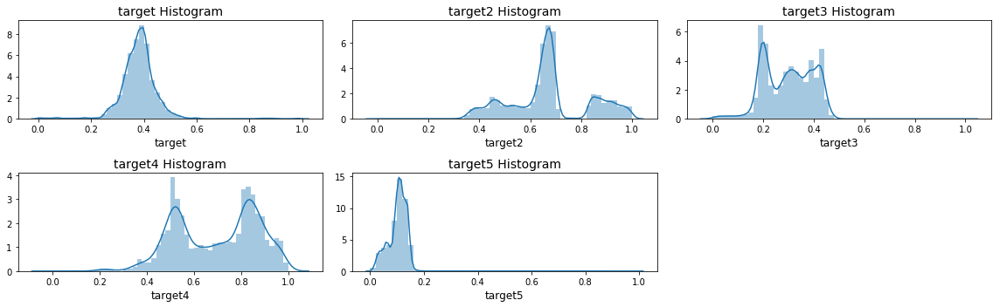

In [11]:
plt.figure(figsize=(16,5))
for i, tar in enumerate(targets):
    sns.distplot(train[tar].values, bins=50, kde=True, ax = plt.subplot(2, 3, i+1))
    plt.xlabel(tar, fontsize=12)
    plt.title(tar + ' Histogram', fontsize=14)

plt.tight_layout()
plt.show()

In [95]:
X_train

,f_0,f_1,f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28,f_29,f_30,f_31,f_32,f_33,f_34,f_35,f_36,f_37,f_38,f_39,f_40,f_41,f_42,f_43,f_44,f_45,f_46,f_47,target,minute,hour,day,weekday,month,is_weekend,s1,c1,s2,c2,s3,c3,s4,c4,s5,c5,s6,c6,s7,c7,s8,c8,fast_mean,slow_mean
timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-10-24 16:00:00,0.865519,0.281363,0.612508,0.000534,0.227709,0.007630,0.153731,0.256985,0.989594,0.996077,0.988018,0.770947,0.767868,0.781809,0.695473,0.868429,0.984824,0.878613,0.962061,0.952020,0.944424,0.982206,0.853692,0.946560,0.725760,0.990037,0.782260,0.884352,0.953855,0.990240,0.981002,0.921946,0.921467,0.733251,0.526433,0.924940,0.227704,0.353487,0.270205,0.004889,0.007799,0.001203,0.001646,0.821028,0.986113,0.834797,0.001324,0.959608,0.314795,0,16,24,0,10,0,3.739119e-02,0.999301,7.473009e-02,9.972038e-01,1.119645e-01,9.937122e-01,1.490423e-01,0.988831,1.859116e-01,0.982566,2.225209e-01,9.749279e-01,2.588190e-01,9.659258e-01,2.947552e-01,0.955573,0.313959,0.302447
2016-10-24 17:00:00,0.865519,0.281363,0.612508,0.001851,0.235363,0.006851,0.134804,0.276019,0.991688,0.989698,0.982293,0.767597,0.763639,0.782417,0.695673,0.862899,0.986203,0.874848,0.965705,0.961345,0.950870,0.986292,0.856688,0.958663,0.726694,0.989162,0.775328,0.910811,0.957670,0.990632,0.968328,0.951618,0.925307,0.735156,0.523557,0.920218,0.227704,0.353487,0.270205,0.004889,0.007799,0.001203,0.001646,0.821875,0.989111,0.827821,0.003865,0.961770,0.314082,0,17,24,0,10,0,7.473009e-02,0.997204,1.490423e-01,9.888308e-01,2.225209e-01,9.749279e-01,2.947552e-01,0.955573,3.653410e-01,0.930874,4.338837e-01,9.009689e-01,5.000000e-01,8.660254e-01,5.633201e-01,0.826239,0.313959,0.302447
2016-10-24 18:00:00,0.865519,0.281363,0.612508,0.000541,0.229984,0.005769,0.130050,0.274311,0.987717,0.992655,0.990290,0.765340,0.767459,0.784075,0.659254,0.865815,0.980447,0.873895,0.960886,0.956415,0.945508,0.984875,0.855260,0.963479,0.724163,0.990121,0.780676,0.898733,0.940905,0.990498,0.971304,0.905782,0.925832,0.735821,0.528445,0.916725,0.227704,0.353487,0.270205,0.004889,0.007799,0.001203,0.001646,0.817478,0.992217,0.824952,0.001938,0.960326,0.314109,0,18,24,0,10,0,1.119645e-01,0.993712,2.225209e-01,9.749279e-01,3.302791e-01,9.438833e-01,4.338837e-01,0.900969,5.320321e-01,0.846724,6.234898e-01,7.818315e-01,7.071068e-01,7.071068e-01,7.818315e-01,0.623490,0.313959,0.302447
2016-10-24 19:00:00,0.865519,0.281363,0.612508,0.002191,0.234389,0.005096,0.124887,0.209803,0.989008,0.995175,0.988703,0.759538,0.761043,0.774701,0.698228,0.867100,0.988277,0.867309,0.962563,0.955675,0.943033,0.986822,0.857353,0.960871,0.723884,0.995074,0.778507,0.863353,0.945040,0.989104,0.978448,0.938295,0.925520,0.737395,0.523974,0.922126,0.227704,0.353487,0.270205,0.004889,0.007799,0.001203,0.001646,0.818144,0.989382,0.827595,0.002328,0.956922,0.314999,0,19,24,0,10,0,1.490423e-01,0.988831,2.947552e-01,9.555728e-01,4.338837e-01,9.009689e-01,5.633201e-01,0.826239,6.801727e-01,0.733052,7.818315e-01,6.234898e-01,8.660254e-01,5.000000e-01,9.308737e-01,0.365341,0.313959,0.302447
2016-10-24 20:00:00,0.865519,0.281363,0.612508,0.000820,0.226486,0.007133,0.136749,0.199968,0.983830,0.988704,0.985729,0.766191,0.760624,0.778640,0.752175,0.865003,0.981881,0.874150,0.955600,0.960610,0.946235,0.986974,0.861973,0.969995,0.727434,0.994046,0.783392,0.871060,0.967752,0.986632,0.955663,0.966474,0.927412,0.737604,0.527415,0.917739,0.227704,0.353487,0.270205,0.004889,0.007799,0.001203,0.001646,0.818746,0.984991,0.818074,0.002160,0.952953,0.313584,0,20,24,0,10,0,1.859116e-01,0.982566,3.653410e-01,9.308737e-01,5.320321e-01,8.467242e-01,6.801727e-01,0.733052,8.045978e-01,0.593820,9.009689e-01,4.338837e-01,9.659258e-01,2.588190e-01,9.972038e-01,0.074730,0.313959,0.302447
2016-10-24 21:00:00,0.865519,0.281363,0.612508,0.000703,0.231016,0.004428,0.129143,0.207252,0.986795,0.987301,0.980235,0.763431,0.764693,0.7

In [137]:
X_train, y_train, X_test, y_test = train_test_split(merged_df, len(merged_df[:'2017-12-31 23:00:00']) - lookback)
X_train = scale_dataframe(X_train, scaler.fit(X_train))
y_train = scale_dataframe(y_train, target_scaler.fit(y_train))
X_train = preprocessing(X_train)

X_test = scale_dataframe(X_test, scaler)
X_test = preprocessing(X_test, train_data=False)

y_train = X_train['target']
X_train = X_train.drop('target', axis=1)

In [138]:
# basic boosting decision.. poor results witout time-specific features

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=10)
gbr = GradientBoostingRegressor()

scores=[]
full_prediction = []
for train_ind, test_ind in tscv.split(X_train):
    used_indexes = len(train_ind) + len(test_ind)
    gbr.fit(X_train.iloc[train_ind], y_train.iloc[train_ind])
    pred = gbr.predict(X_train.iloc[test_ind])
    
    # for drawing prediction
    full_prediction.append(np.concatenate([y_train[train_ind].values, pred, np.zeros(len(X_train) - used_indexes)]))
    
    score = MSE(y_train.iloc[test_ind], pred)**0.5
    scores.append(score)
    print('train len: ', len(train_ind), '\t till ', X_train.index[train_ind[-1]]  ,'\t score: ' , score)

print('average score: ', np.mean(scores))

train len:  880 	 till  2016-11-30 07:00:00 	 score:  0.028957498620716986
train len:  1760 	 till  2017-01-05 23:00:00 	 score:  0.021360121313438448
train len:  2640 	 till  2017-02-11 15:00:00 	 score:  0.04706813769914177
train len:  3520 	 till  2017-03-20 07:00:00 	 score:  0.04360052296331629
train len:  4400 	 till  2017-04-25 23:00:00 	 score:  0.010560717297942007
train len:  5280 	 till  2017-06-01 15:00:00 	 score:  0.01208986803858466
train len:  6160 	 till  2017-07-08 07:00:00 	 score:  0.012577113424656066
train len:  7040 	 till  2017-08-13 23:00:00 	 score:  0.009329433611775222
train len:  7920 	 till  2017-09-19 15:00:00 	 score:  0.05452779289072231
train len:  8800 	 till  2017-10-26 07:00:00 	 score:  0.009481317140706245
average score:  0.024955252300099998


In [141]:
# draw prediction - score is 0.4803
# best is scale all features and boosting

pred_df = pd.DataFrame(full_prediction[9], index=X_train.index)
print(pred_df.mean())
pred_df = restore_dataframe(pred_df, target_scaler)

quality_metric(pred_df, merged_df.loc[pred_df.index].target)
pred_df.hvplot() * merged_df.target.hvplot()

# Making a submission file #
#save_prediction(pred, 'gru_baseline2.csv')

#0.5562 оценка  RMSE
# 0.5248 - my score

0    0.380963
dtype: float64
RNN rmse 0.01882313920219348
baseline rmse 0.5199422024661987


:Overlay
   .Curve.I      :Curve   [timestamp]   (0)
   .Curve.Target :Curve   [timestamp]   (target)

In [142]:
# prediction
pred = gbr.predict(X_test.drop('target', axis=1)['2018':])
pred_df = pd.DataFrame(pred, index=X_test['2018':].index, columns=['prediction'])
pred_df = restore_dataframe(pred_df, target_scaler)
save_prediction(pred_df.values, filename='grad_boost.csv')

In [143]:
pred_df.prediction.hvplot() * merged_df.target.hvplot() * scaled_df.hvplot()

# scaled sklearn boosting
#0.4803 оценка  RMSE
# 0.079 - my score

:Overlay
   .Curve.Prediction :Curve   [timestamp]   (prediction)
   .Curve.Target     :Curve   [timestamp]   (target)
   .Curve.I          :Curve   [timestamp]   (0)

# добавить обработку аномалий!

In [7]:
from keras.models import Sequential
from keras.layers import Flatten, Dense, LSTM, GRU
from keras.optimizers import RMSprop
from keras.callbacks import EarlyStopping, TensorBoard
from keras.preprocessing.sequence import TimeseriesGenerator

validation_start_index = len(merged_df[:'2017-09-01 00:00:00'])
test_start_index = len(merged_df[:'2017-10-30 00:00:00'])
prediction_start_index = len(train)

lookback = 30*24
step = 6
delay = 1
batch_size = 64

print('train: \t\t' ,validation_start_index)
print('validation:\t', test_start_index - validation_start_index)
print('test: \t\t', len(X_train) - test_start_index)

Using TensorFlow backend.


NameError: name 'train' is not defined

In [ ]:
val_steps = (len(X_train) - validation_start_index - lookback) // batch_size
test_steps = (len(X_test) - lookback) // batch_size

train_data_gen = TimeseriesGenerator(X_train.values, y_train.values, start_index=0, end_index=validation_start_index,
                               length=lookback, sampling_rate=step, batch_size=batch_size)

val_data_gen = TimeseriesGenerator(X_train.values, y_train.values, start_index=validation_start_index - lookback + 1, 
                                   end_index=test_start_index,
                               length=lookback, sampling_rate=step, batch_size=batch_size)

test_data_gen = TimeseriesGenerator(X_train.values, y_train.values, start_index=test_start_index - lookback + 1, 
                                   end_index=None,
                               length=lookback, sampling_rate=step, batch_size=batch_size)

submission_data_gen = TimeseriesGenerator(X_test.values, y_test.values, start_index=0, 
                                   end_index=None,
                               length=lookback, sampling_rate=step, batch_size=batch_size)

In [ ]:
callbacks_list = [EarlyStopping(monitor='val_loss', patience=2),
                 #TensorBoard(log_dir='my_log_dir', histogram_freq=1, embeddings_freq=1)
                 ]

model = Sequential()
#model.add(Flatten(input_shape=(train_data_gen[0][0][0].shape))) #lookback // step, X_train.shape[-1])))
model.add(GRU(128, dropout=0.1, recurrent_dropout=0.5, input_shape=(train_data_gen[0][0][0].shape), 
               return_sequences=True
              ))
#model.add(GRU(64, dropout=0.2, recurrent_dropout=0.7, return_sequences=True))
model.add(GRU(32, dropout=0.1, recurrent_dropout=0.5))
#model.add(Dense(32, activation='relu'))
model.add(Dense(1))
model.compile(optimizer=RMSprop(), loss='mae')

model.summary()

Epoch 1/20
40/40 [==============================] - 9s 215ms/step - loss: 0.4524 - val_loss: 0.2308
Epoch 2/20
40/40 [==============================] - 7s 163ms/step - loss: 0.1771 - val_loss: 0.1424
Epoch 3/20
40/40 [==============================] - 7s 164ms/step - loss: 0.1061 - val_loss: 0.1054
Epoch 4/20
40/40 [==============================] - 7s 164ms/step - loss: 0.0727 - val_loss: 0.0840
Epoch 5/20
40/40 [==============================] - 7s 164ms/step - loss: 0.0527 - val_loss: 0.0662
Epoch 6/20
40/40 [==============================] - 7s 165ms/step - loss: 0.0726 - val_loss: 0.0655
Epoch 7/20
40/40 [==============================] - 7s 170ms/step - loss: 0.0421 - val_loss: 0.0677
Epoch 8/20
40/40 [==============================] - 7s 170ms/step - loss: 0.0489 - val_loss: 0.0685


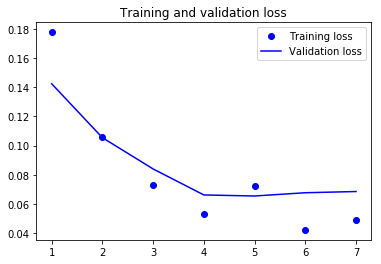

In [51]:
history = model.fit_generator(train_data_gen, steps_per_epoch=40, epochs=20, validation_data=val_data_gen, 
                              validation_steps=val_steps, callbacks=callbacks_list)

print_learning_curve(history, skip_first=1)

In [52]:
pred = model.predict_generator(submission_data_gen)
pred_df = pd.DataFrame(pred, index=X_test['2018':].index)
pred_df.hvplot()

#save_prediction(pred, 'gru_baseline.csv')

:Curve   [timestamp]   (0)

In [56]:
# train
test_pred = model.predict_generator(train_data_gen)
test_df = pd.DataFrame(test_pred, index=X_train.iloc[lookback-1:validation_start_index].index, columns=['prediction'])
test_df = restore_dataframe(test_df, target_scaler)
test_df['target'] = merged_df.iloc[lookback-1:validation_start_index].target
print('validation length', len(test_pred))

quality_metric(test_df['target'], test_df['prediction'])
test_df.hvplot()

validation length 6754
RNN rmse 0.4601149348886657
baseline rmse 0.06011746353813932


:NdOverlay   [Variable]
   :Curve   [timestamp]   (value)

In [57]:
# validation
test_pred = model.predict_generator(val_data_gen)
test_df = pd.DataFrame(test_pred, index=X_train.iloc[validation_start_index: test_start_index].index, columns=['prediction'])
test_df = restore_dataframe(test_df, target_scaler)
test_df['target'] = merged_df.iloc[validation_start_index: test_start_index].target
print('validation length', len(test_pred))

quality_metric(test_df['target'], test_df['prediction'])
test_df.hvplot()

validation length 1416
RNN rmse 0.8496011174506559
baseline rmse 0.2969094724991075


:NdOverlay   [Variable]
   :Curve   [timestamp]   (value)

In [55]:
test_pred = model.predict_generator(test_data_gen)
test_df = pd.DataFrame(test_pred, index=X_train.iloc[test_start_index+1:].index, columns=['prediction'])
test_df['target'] = X_train.iloc[test_start_index+1:].target
print('test length', len(test_pred))

quality_metric(test_df['target'], test_df['prediction'])
test_df.hvplot()

test length 790
RNN rmse 0.04730220306336454
baseline rmse 0.031231847786721226


:NdOverlay   [Variable]
   :Curve   [timestamp]   (value)

In [31]:
# with unscale
y_scaler = MinMaxScaler()
y_scaler.fit(merged_df[['target']])

test_pred = model.predict_generator(test_data_gen)
test_df = pd.DataFrame(test_pred, index=X_train.iloc[test_start_index+1:].index, columns=['prediction'])

test_df = restore_dataframe(test_df, y_scaler)
test_df['target'] = merged_df.iloc[test_start_index+1:].target
print('test length', len(test_pred))

quality_metric(test_df['target'], test_df['prediction'])
test_df.hvplot()

test length 790
RNN rmse 17.492505784440542
baseline rmse 17.491012040470515


:NdOverlay   [Variable]
   :Curve   [timestamp]   (value)

In [15]:
graph1 = merged_df.f_25.hvplot(width = width, height = height) + merged_df.f_26.hvplot(width = width, height = height) + \
        train.target.hvplot(width = width, height = height) + train.target2.hvplot(width = width, height = height) + \
        merged_df.f_46.hvplot(width = width, height = height) + merged_df.f_47.hvplot(width = width, height = height)
graph1.cols(2)

:Layout
   .Curve.F_25    :Curve   [timestamp]   (f_25)
   .Curve.F_26    :Curve   [timestamp]   (f_26)
   .Curve.Target  :Curve   [timestamp]   (target)
   .Curve.Target2 :Curve   [timestamp]   (target2)
   .Curve.F_46    :Curve   [timestamp]   (f_46)
   .Curve.F_47    :Curve   [timestamp]   (f_47)

In [61]:
nonscaled = pd.DataFrame({'a':[100, 500, 1000, 400], 
                         'b':[50, 60, 80, 30]})
nonscaled

,a,b
0,100,50
1,500,60
2,1000,80
3,400,30


In [75]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

scaled = scale_dataframe(nonscaled, scaler.fit(nonscaled))
scaled

,a,b
0,0.000000,0.4
1,0.444444,0.6
2,1.000000,1.0
3,0.333333,0.0


In [76]:
recovered = scaler.inverse_transform(scaled)
recovered

array([[ 100.,   50.],
       [ 500.,   60.],
       [1000.,   80.],
       [ 400.,   30.]])

In [50]:
(X_train.f_23.hvplot() + X_train.target.hvplot()).cols(1)

:Layout
   .Curve.F_23   :Curve   [timestamp]   (f_23)
   .Curve.Target :Curve   [timestamp]   (target)